In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

plt.style.use('ggplot')

In [2]:
# reading the data
df = pd.read_csv("../input/ab-nyc-2019/AB_NYC_2019.csv")
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


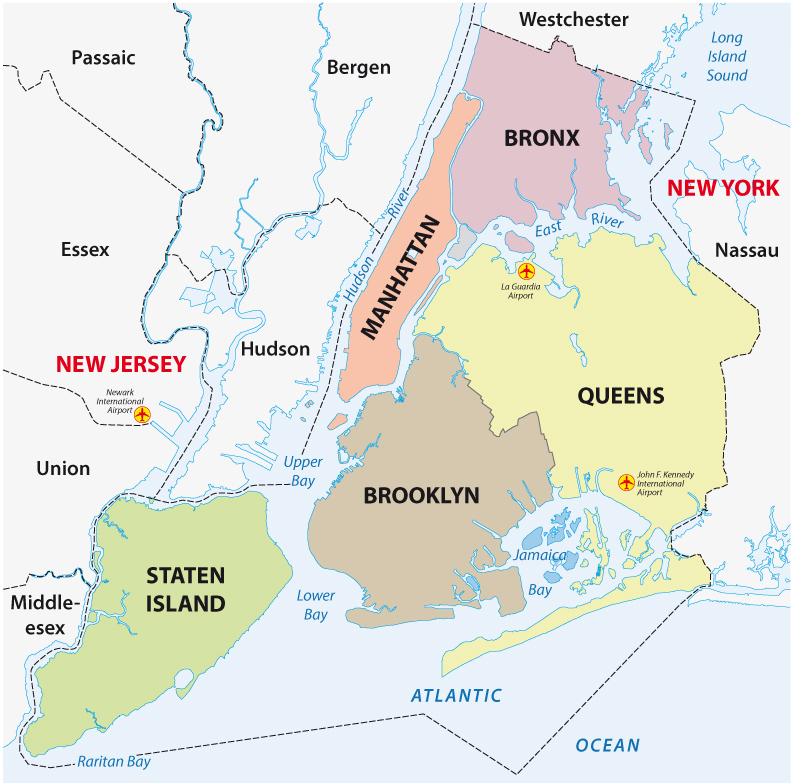

# Pandas Profiling Package

In [3]:
#pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
!pip install pandas_profiling

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


# EDA with Pandas Profileing Library 

In [4]:
import pandas_profiling
df.profile_report()

In [5]:
#Let's see about the datatypes of the data
df.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [7]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [8]:
df.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

In [9]:
df = df[ ['name', 'host_id', 'host_name', 'neighbourhood_group', 'neighbourhood',
       'latitude', 'longitude', 'room_type', 'minimum_nights',
       'number_of_reviews', 'last_review', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365','price'] ]

In [10]:
df.head()

,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,price
0,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,1,9,2018-10-19,0.21,6,365,149
1,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,1,45,2019-05-21,0.38,2,355,225
2,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,3,0,NaN,NaN,1,365,150
3,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,1,270,2019-07-05,4.64,1,194,89
4,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,10,9,2018-11-19,0.10,1,0,80


In [11]:
df.shape

(48895, 15)

In [12]:
# with default: dropna = True and missing values are not unique!
df.host_id.nunique()

37457

# Data Cleaning & Pre-Processing

In [13]:
df.isna().sum()

name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
price                                 0
dtype: int64

In [14]:
df.last_review

0        2018-10-19
1        2019-05-21
2               NaN
3        2019-07-05
4        2018-11-19
            ...    
48890           NaN
48891           NaN
48892           NaN
48893           NaN
48894           NaN
Name: last_review, Length: 48895, dtype: object

In [15]:
# converting last_review to datetime
# replacing NaN values with 0 

df['last_review']= pd.to_datetime(df['last_review'])

df.last_review.fillna(max(df.last_review),inplace=True)

df.reviews_per_month.fillna(0,inplace=True)

In [16]:
df.reviews_per_month

0        0.21
1        0.38
2        0.00
3        4.64
4        0.10
         ... 
48890    0.00
48891    0.00
48892    0.00
48893    0.00
48894    0.00
Name: reviews_per_month, Length: 48895, dtype: float64

In [17]:
#removing unwanted columns
df.drop(['name','host_name'],axis=1,inplace=True)

In [18]:
#checking if any null values present now
df.isna().sum()

host_id                           0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
price                             0
dtype: int64

# Exploratory Data Analysis

let's see what hosts (IDs) have the most listings on Airbnb platform and taking advantage of this service

In [19]:
top_host = df.host_id.value_counts().head(10)
top_host

219517861    327
107434423    232
30283594     121
137358866    103
12243051      96
16098958      96
61391963      91
22541573      87
200380610     65
7503643       52
Name: host_id, dtype: int64

### The host with maximum number of listings registered for airbnb in NewYork has 327 listings.

### lets create a DataFrame!

In [20]:
top_host_df = pd.DataFrame(top_host)

top_host_df.reset_index(inplace=True)
top_host_df.rename(columns={'index':'Host_ID', 'host_id':'P_Count'}, inplace=True)
top_host_df

,Host_ID,P_Count
0,219517861,327
1,107434423,232
2,30283594,121
3,137358866,103
4,12243051,96
5,16098958,96
6,61391963,91
7,22541573,87
8,200380610,65
9,7503643,52


coming back to our dataset we can confirm our fidnings with already existing column called 'calculated_host_listings_count'

In [21]:
top_host_check = df.calculated_host_listings_count.max()
top_host_check

327

In [22]:
df.neighbourhood_group.unique()

array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

In [23]:
df.room_type.unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

let's grab 10 most reviewed listings in NYC

In [24]:
top_reviewed_listings = df.nlargest(10,'number_of_reviews')
top_reviewed_listings

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,price
11759,47621202,Queens,Jamaica,40.66730,-73.76831,Private room,1,629,2019-07-05,14.58,2,333,47
2031,4734398,Manhattan,Harlem,40.82085,-73.94025,Private room,1,607,2019-06-21,7.75,3,293,49
2030,4734398,Manhattan,Harlem,40.82124,-73.93838,Private room,1,597,2019-06-23,7.72,3,342,49
2015,4734398,Manhattan,Harlem,40.82264,-73.94041,Private room,1,594,2019-06-15,7.57,3,339,49
13495,47621202,Queens,Jamaica,40.66939,-73.76975,Private room,1,576,2019-06-27,13.40,2,173,47
10623,37312959,Queens,East Elmhurst,40.77006,-73.87683,Private room,1,543,2019-07-01,11.59,5,163,46
1879,2369681,Manhattan,Lower East Side,40.71921,-73.99116,Private room,2,540,2019-07-06,6.95,1,179,99
20403,26432133,Queens,East Elmhurst,40.76335,-73.87007,Private room,1,510,2019-07-06,16.22,5,341,48
4870,12949460,Brooklyn,Park Slope,40.67926,-73.97711,Entire home/apt,1,488,2019-07-01,8.14,1,269,160
471,792159,Brooklyn,Bushwick,40.70283,-73.92131,Private room,3,480,2019-07-07,6.70,1,0,60


# Exploring and Visualizing Data

In [25]:
#setting figure size for future visualizations
sns.set(rc={'figure.figsize':(10,8)})
sns.set_style('white')

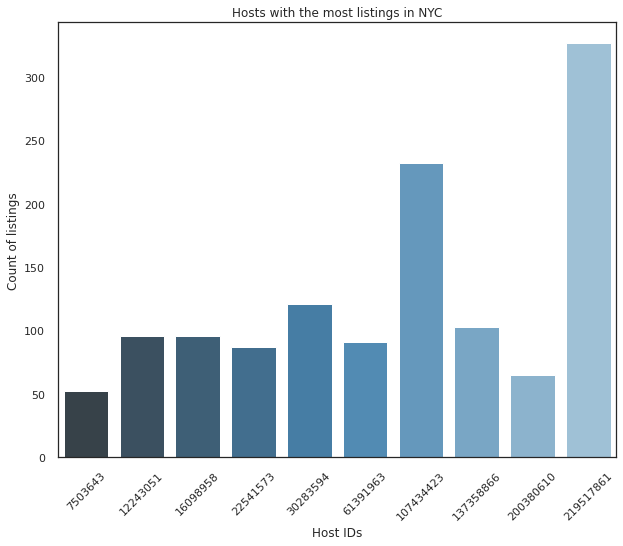

In [26]:
viz_1 = sns.barplot(x="Host_ID", y="P_Count", data=top_host_df, palette='Blues_d')

viz_1.set_title('Hosts with the most listings in NYC')

viz_1.set_ylabel('Count of listings')
viz_1.set_xlabel('Host IDs')

viz_1.set_xticklabels(viz_1.get_xticklabels(), rotation=45);

Text(0.5, 0, 'Count of listings')

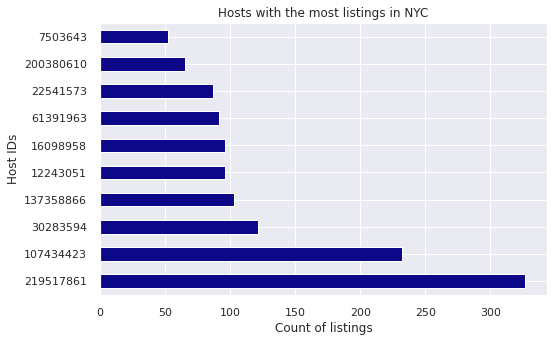

In [27]:
#setting figure size for future visualizations

sns.set(rc = {'figure.figsize':(8,5)} )

viz_1 = top_host.plot(kind='barh',cmap='plasma')

# Kind = pie
# plasma is for color blue color

viz_1.set_title('Hosts with the most listings in NYC')
viz_1.set_ylabel('Host IDs')
viz_1.set_xlabel('Count of listings')

# viz_1.set_xticklabels(viz_1.get_xticklabels())

In [28]:
df.neighbourhood.value_counts()[:20]
df

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,price
0,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,1,9,2018-10-19,0.21,6,365,149
1,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,1,45,2019-05-21,0.38,2,355,225
2,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,3,0,2019-07-08,0.00,1,365,150
3,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,1,270,2019-07-05,4.64,1,194,89
4,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,10,9,2018-11-19,0.10,1,0,80
...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,8232441,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,2,0,2019-07-08,0.00,2,9,70
48891,6570630,Brooklyn,Bushwick,40.70184,-73.93317,Private room,4,0,2019-07-08,0.00,2,36,40
48892,23492952,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,10,0,2019-07-08,0.00,1,27,115
48893,30985759,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,1,0,2019-07-08,0.00,6,2,55


<BarContainer object of 20 artists>

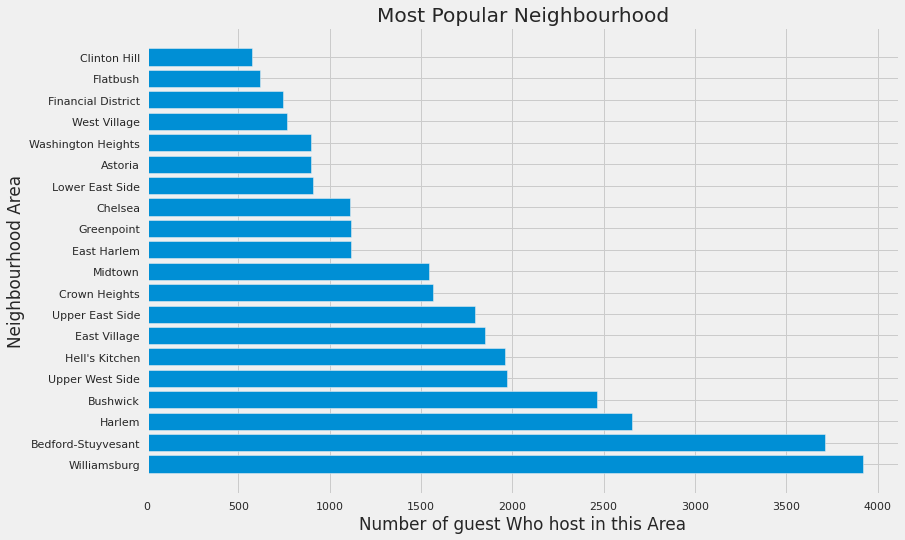

In [29]:
plt.style.use("fivethirtyeight")


data = df.neighbourhood.value_counts()[:20]

plt.figure(figsize=(12, 8))

x = list(data.index) 
y = list(data.values)

# x.reverse()
# y.reverse()


plt.title("Most Popular Neighbourhood")
plt.ylabel("Neighbourhood Area")
plt.xlabel("Number of guest Who host in this Area")

plt.barh(x, y)

In [30]:
avg_by_neighbourhood_group = df.groupby(['neighbourhood_group']).mean()
avg_by_neighbourhood_group

,host_id,latitude,longitude,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,price
neighbourhood_group,,,,,,,,,
Bronx,1.056099e+08,40.848305,-73.884552,4.560953,26.004583,1.475655,2.233731,165.758937,87.496792
Brooklyn,5.671526e+07,40.685036,-73.951190,6.056556,24.202845,1.049790,2.284371,100.232292,124.383207
Manhattan,6.783062e+07,40.765062,-73.974607,8.579151,20.985596,0.976782,12.791330,111.979410,196.875814
Queens,9.615680e+07,40.731531,-73.872775,5.181433,27.700318,1.567076,4.060184,144.451818,99.517649
Staten Island,9.853360e+07,40.610225,-74.105805,4.831099,30.941019,1.576381,2.319035,199.678284,114.812332


In [31]:
# Let's prepare some data through indexing, grouping and sorting before we plot it

avg_by_neighbourhood_group = df.groupby(['neighbourhood_group']).mean()
avg_price_by_neighbourhood_group_sorted= avg_by_neighbourhood_group['price'].sort_values(ascending=False)
avg_price_by_neighbourhood_group_sorted

neighbourhood_group
Manhattan        196.875814
Brooklyn         124.383207
Staten Island    114.812332
Queens            99.517649
Bronx             87.496792
Name: price, dtype: float64

(0.0, 250.0)

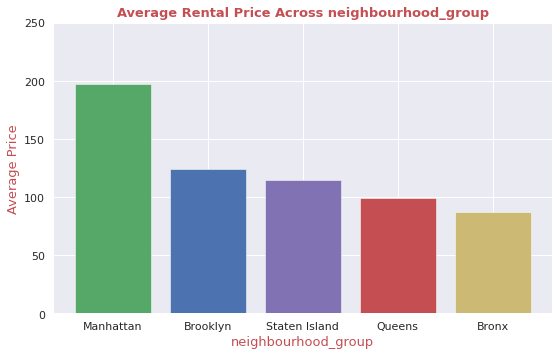

In [32]:
# Here I decided to state the colors ahead of time as a named list and pass that list when plotting the bar
sns.set_style('darkgrid')

le_colors =['g','b','m','r','y']
plt.bar(x=avg_price_by_neighbourhood_group_sorted.index, height=avg_price_by_neighbourhood_group_sorted, color=le_colors)

plt.title('Average Rental Price Across neighbourhood_group',color='r',fontsize=13,fontweight='bold')
plt.xlabel('neighbourhood_group',color='r',fontsize=13)
plt.ylabel('Average Price',color='r',fontsize=13)
plt.ylim(0,250)

# i want to add the values for the bars

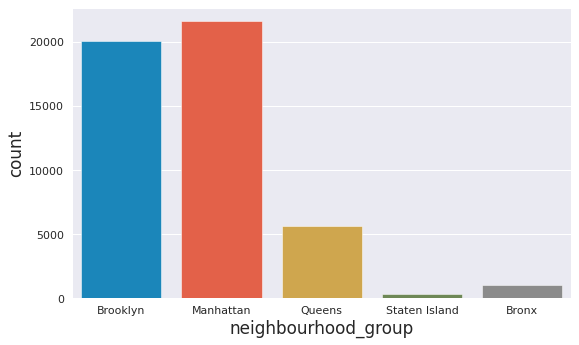

In [33]:
sns.countplot(x='neighbourhood_group',data= df )

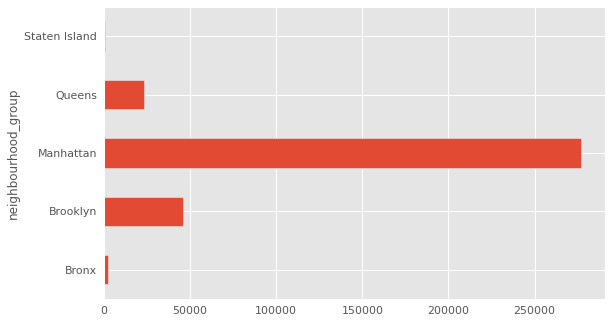

In [34]:
a=df.groupby('neighbourhood_group').calculated_host_listings_count.sum()
a

plt.style.use('ggplot')
a.plot(kind='barh')

# Obeservations:

* Manhattan neighbourhood group has highest number of listings in whole New York area.
* Number of hosts ownning the listings are highest in Manhattan followed by Brooklyn

neighbourhood_group
Bronx            48
Brooklyn         47
Manhattan        32
Queens           51
Staten Island    43
Name: neighbourhood, dtype: int64


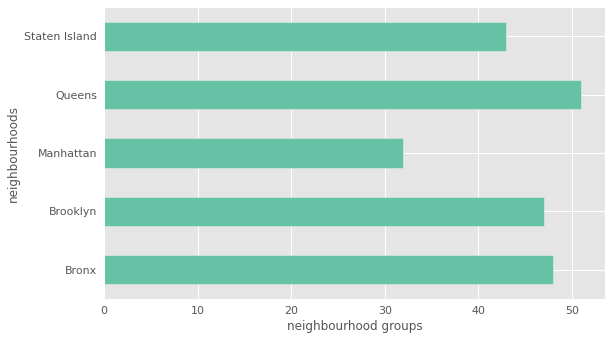

In [35]:
df.groupby('neighbourhood_group')['neighbourhood'].nunique().plot(kind='barh',colormap='Set2')


plt.xlabel('neighbourhood groups')
plt.ylabel('neighbourhoods')

print(df.groupby('neighbourhood_group')['neighbourhood'].nunique())

# Observation: 
### Queens has highest number of neighbourhoods within its zone while Manhattan has lowest number of neighbourhoods. Still, number of listings registered in AirBnB is in Manhattan region

In [36]:
# One useful way of visualizing this would be to separate the values into ranges of days,
# say into 4 groups as follows:

a_availability = df[df['availability_365']<=90].count()[0]
b_availability = df[(df['availability_365']>90) & (df['availability_365']<=180)].count()[0]
c_availability = df[(df['availability_365']>180) & (df['availability_365']<=270)].count()[0]
d_availability = df[(df['availability_365']>270)].count()[0]

In [37]:
c_availability

4513

In [38]:
df[(df['availability_365']>90) & (df['availability_365']<=180)]

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,price
5,7322,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,3,74,2019-06-22,0.59,1,129,200
40,46978,Manhattan,East Village,40.72290,-73.98199,Private room,2,245,2019-06-21,2.08,2,96,68
45,49670,Brooklyn,Prospect-Lefferts Gardens,40.65944,-73.96238,Entire home/apt,29,11,2019-06-05,0.49,1,95,150
52,56104,Brooklyn,Williamsburg,40.70420,-73.93560,Entire home/apt,3,82,2019-05-17,0.70,1,140,228
59,60049,Manhattan,SoHo,40.72210,-73.99775,Entire home/apt,30,21,2019-06-29,0.30,1,154,180
...,...,...,...,...,...,...,...,...,...,...,...,...,...
48866,274225617,Queens,Briarwood,40.70786,-73.81448,Entire home/apt,1,0,2019-07-08,0.00,1,159,58
48875,274273284,Manhattan,East Harlem,40.78749,-73.94749,Private room,1,0,2019-07-08,0.00,1,180,140
48878,41326856,Queens,Elmhurst,40.74477,-73.87727,Private room,1,0,2019-07-08,0.00,5,172,45
48886,274311461,Manhattan,Midtown,40.75561,-73.96723,Entire home/apt,6,0,2019-07-08,0.00,1,176,200


In [39]:
df[(df['availability_365']>90) & (df['availability_365']<=180)].count()

host_id                           5285
neighbourhood_group               5285
neighbourhood                     5285
latitude                          5285
longitude                         5285
room_type                         5285
minimum_nights                    5285
number_of_reviews                 5285
last_review                       5285
reviews_per_month                 5285
calculated_host_listings_count    5285
availability_365                  5285
price                             5285
dtype: int64

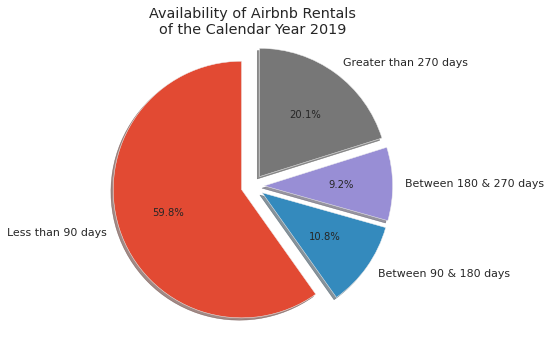

In [40]:
# With our ranges created using indexing and '&' operators, the data can be plotted in a pie chart

labels = 'Less than 90 days','Between 90 & 180 days','Between 180 & 270 days','Greater than 270 days'

sizes = a_availability,b_availability,c_availability,d_availability
explode = (.1,.1,.1,.1)

availability_pie = plt.pie(sizes,labels=labels,explode=explode,shadow=True,startangle=90,autopct='%1.1f%%',radius=1.1)
plt.title('Availability of Airbnb Rentals\n'+'of the Calendar Year 2019');

Total neighbourhoods in NYC in which listings are located: 48895


Text(0, 0.5, 'Listings')

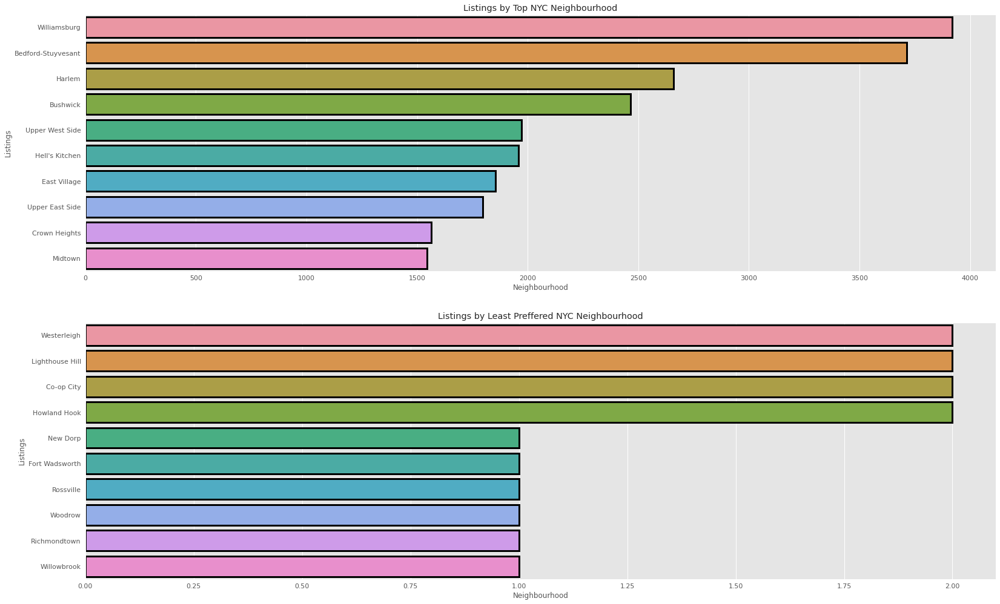

In [41]:
print('Total neighbourhoods in NYC in which listings are located: {}'.format(df.neighbourhood.value_counts().sum()))

plt.figure(figsize=(24,16))

# Top 10 neighbourhoods in NYC

plt.subplot(2,1,1)
V2=sns.countplot(y='neighbourhood', #Create a Horizontal Plot
                   data=df,                                                    
                   order=df.neighbourhood.value_counts().iloc[:10].index, #We want to view the top 10 Neighbourhoods
                   edgecolor=(0,0,0), #This cutomization gives us black borders around our plot bars
                   linewidth=3)

V2.set_title('Listings by Top NYC Neighbourhood') #Set Title
V2.set_xlabel('Neighbourhood')                                  
V2.set_ylabel('Listings')

# 10 Least preferred neighbourhood in NYC

plt.subplot(2,1,2)
V3 = sns.countplot(y='neighbourhood',
                   data=df,                                                    
                   order=df.neighbourhood.value_counts().iloc[-10:].index,
                   edgecolor=(0,0,0), 
                   linewidth=3)

V3.set_title('Listings by Least Preffered NYC Neighbourhood')   
V3.set_xlabel('Neighbourhood')                                  
V3.set_ylabel('Listings')

# Room type analysis

In [42]:
df.room_type.unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

In [43]:
by_room = df.groupby('room_type').agg(['count'])
by_room.head()
# low number of shared room and discovered hard

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,price
,count,count,count,count,count,count,count,count,count,count,count,count
room_type,,,,,,,,,,,,
Entire home/apt,25409,25409,25409,25409,25409,25409,25409,25409,25409,25409,25409,25409
Private room,22326,22326,22326,22326,22326,22326,22326,22326,22326,22326,22326,22326
Shared room,1160,1160,1160,1160,1160,1160,1160,1160,1160,1160,1160,1160


Next, let's turn our attention to price distributions

In [44]:
# It would be great to break things down by borough AND room type. There are several ways to do so.
# A pivot table is a great place to start

room_pivot = pd.pivot_table(df,'price',['neighbourhood_group','room_type'],aggfunc=np.mean)
room_pivot

price
neighbourhood_group room_type                  
Bronx               Entire home/apt  127.506596
                    Private room      66.788344
                    Shared room       59.800000
Brooklyn            Entire home/apt  178.327545
                    Private room      76.500099
                    Shared room       50.527845
Manhattan           Entire home/apt  249.239109
                    Private room     116.776622
                    Shared room       88.977083
Queens              Entire home/apt  147.050573
                    Private room      71.762456
                    Shared room       69.020202
Staten Island       Entire home/apt  173.846591
                    Private room      62.292553
                    Shared room       57.444444

In [45]:
by_room = df.groupby('room_type').agg(['count'])
by_room.head()

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,price
,count,count,count,count,count,count,count,count,count,count,count,count
room_type,,,,,,,,,,,,
Entire home/apt,25409,25409,25409,25409,25409,25409,25409,25409,25409,25409,25409,25409
Private room,22326,22326,22326,22326,22326,22326,22326,22326,22326,22326,22326,22326
Shared room,1160,1160,1160,1160,1160,1160,1160,1160,1160,1160,1160,1160


Entire home/apt    25409
Private room       22326
Shared room         1160
Name: room_type, dtype: int64

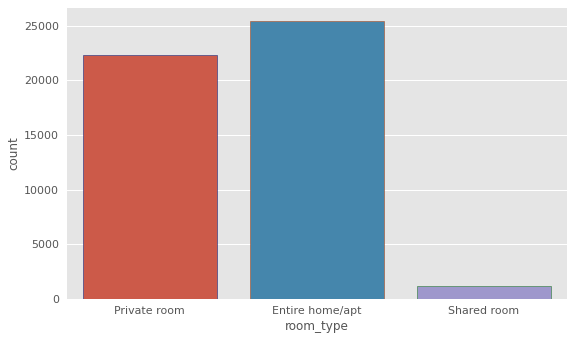

In [46]:
sns.countplot(x='room_type',data=df ,edgecolor=sns.color_palette("dark"))
df.room_type.value_counts()

In [47]:
print('Percentage of room types available in AirBnB registered listings are:\n{}'.format((df.room_type.value_counts()/len(df.room_type))*100))


Percentage of room types available in AirBnB registered listings are:
Entire home/apt    51.966459
Private room       45.661111
Shared room         2.372431
Name: room_type, dtype: float64


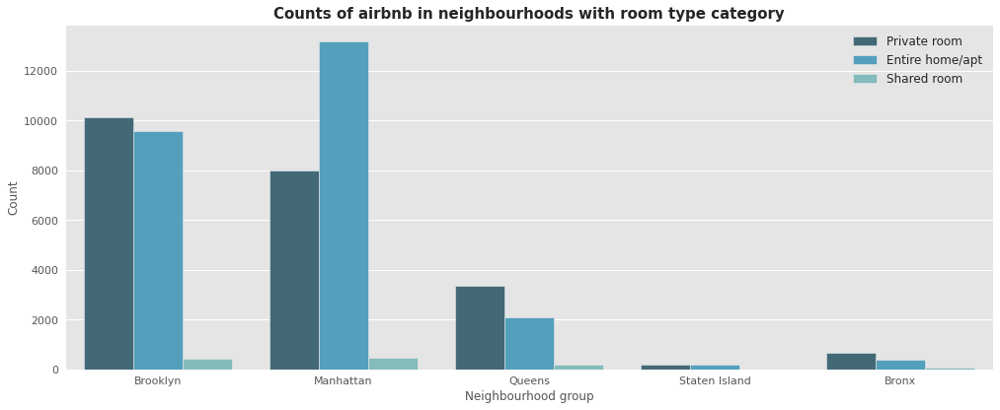

In [48]:
# Visualisation - Neighbourhood groups with counts with category room_type

plt.figure(figsize=(15,6))

sns.countplot(data=df, x='neighbourhood_group', hue='room_type', palette='GnBu_d')

plt.title('Counts of airbnb in neighbourhoods with room type category', fontsize=15,fontweight='bold')
plt.xlabel('Neighbourhood group')
plt.ylabel("Count")

plt.legend(frameon=False, fontsize=12)

<Figure size 1080x432 with 0 Axes>

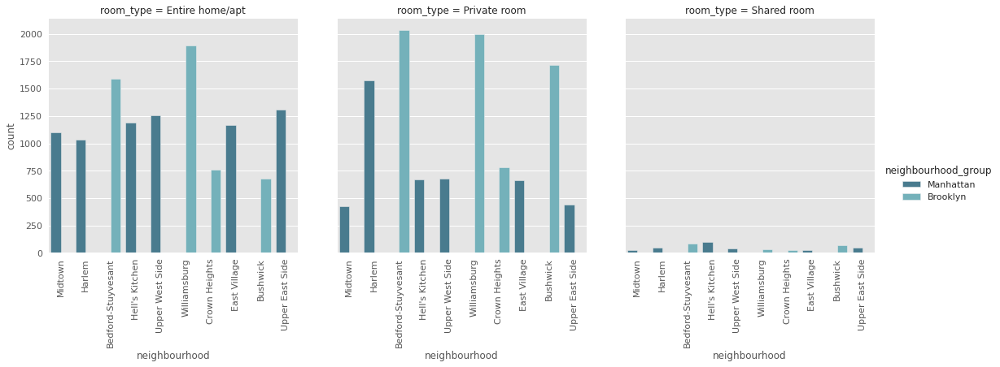

In [49]:
top_nei = df['neighbourhood'].value_counts().reset_index().head(10)
top_nei = top_nei['index']

plt.figure(figsize=(15,6))
vis_3 = sns.catplot(x='neighbourhood', hue='neighbourhood_group', col='room_type',
                    data=df.loc[df['neighbourhood'].isin(top_nei)], kind='count', palette='GnBu_d')

vis_3.set_xticklabels(rotation=90)

Text(0.5, 1.0, 'Room types availability in AirBnB')

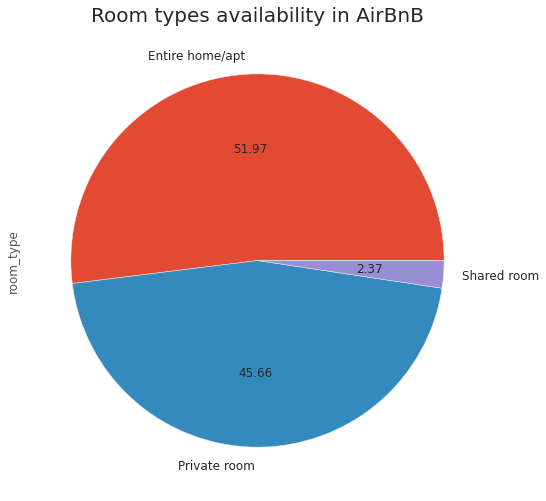

In [50]:
b=df.room_type.value_counts()/len(df.room_type)

b.plot.pie(autopct='%.2f',fontsize=12,figsize=(8,8))

plt.title('Room types availability in AirBnB',fontsize=20)

In [51]:
! pip install plotly

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [52]:
import plotly.graph_objects as go
import plotly.express as px

In [53]:
labels = df.room_type.value_counts().index
values = df.room_type.value_counts().values

labels

Index(['Entire home/apt', 'Private room', 'Shared room'], dtype='object')

In [54]:
colors = ['gold', 'mediumturquoise', 'darkorange', 'lightgreen']

labels = df.room_type.value_counts().index
values = df.room_type.value_counts().values

# Use `hole` to create a donut-like pie chart
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.5)])

fig.update_traces(marker=dict(colors = colors, line=dict(color='#000000', width=4)))

fig.show()

In [55]:
len(df.room_type)

48895

# Number of room type in each neighbourhood group!

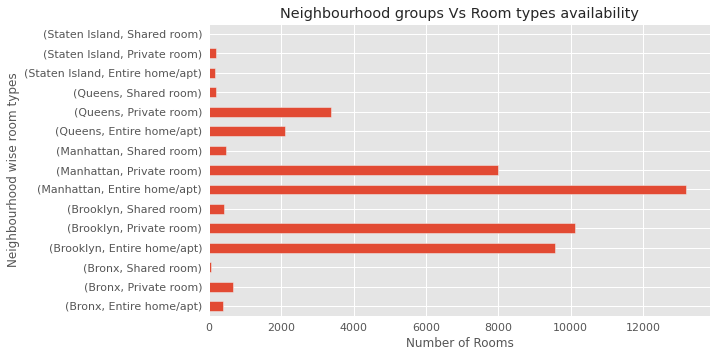

In [56]:
df.groupby(['neighbourhood_group','room_type']).room_type.count().plot.barh()


plt.ylabel('Neighbourhood wise room types')
plt.xlabel('Number of Rooms')
plt.title('Neighbourhood groups Vs Room types availability');

In [57]:
#grabbing top 10 neighbourhoods for sub-dataframe
sns.set(rc={'figure.figsize':(4,4)})

sub = df.loc[df['neighbourhood'].isin(['Williamsburg','Bedford-Stuyvesant','Harlem','Bushwick',
                 'Upper West Side','Hell\'s Kitchen''East Village','Upper East Side','Crown Heights','Midtown'])]

sub

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,price
1,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,1,45,2019-05-21,0.38,2,355,225
2,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,3,0,2019-07-08,0.00,1,365,150
6,7356,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,45,49,2017-10-05,0.40,1,0,60
8,7490,Manhattan,Upper West Side,40.80178,-73.96723,Private room,2,118,2017-07-21,0.99,1,0,79
10,7702,Manhattan,Upper West Side,40.80316,-73.96545,Entire home/apt,5,53,2019-06-22,0.43,1,6,135
...,...,...,...,...,...,...,...,...,...,...,...,...,...
48886,274311461,Manhattan,Midtown,40.75561,-73.96723,Entire home/apt,6,0,2019-07-08,0.00,1,176,200
48887,208514239,Brooklyn,Williamsburg,40.71232,-73.94220,Entire home/apt,1,0,2019-07-08,0.00,3,365,170
48890,8232441,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,2,0,2019-07-08,0.00,2,9,70
48891,6570630,Brooklyn,Bushwick,40.70184,-73.93317,Private room,4,0,2019-07-08,0.00,2,36,40


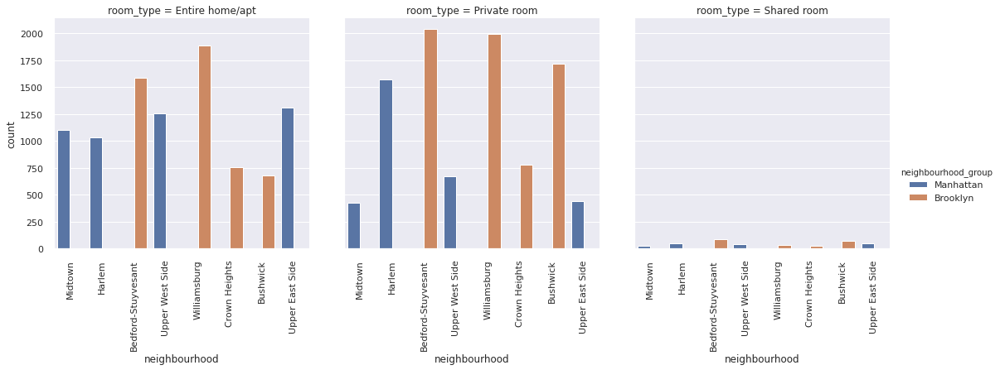

In [58]:
#using catplot to represent multiple interesting attributes together and a count

viz=sns.catplot(x='neighbourhood', hue='neighbourhood_group', col='room_type', data=sub, kind='count')
viz.set_xticklabels(rotation=90)

# Observation:

#### In all the listings of rooms registered in AirBnB more than 50% of listings offer complete houses or apartments and remaining are private rooms. Only 2% of listings offer shared rooms.
#### Brooklyn is a zone which has maximum listings offering private rooms while manhattan is an hub of apartment offerings, followed by Brooklyn.
#### Bronx, Queen and Staten Island has least number of listings registered and does not offer much of the services.

# Price wise analysis of rooms

In [59]:
df.groupby('neighbourhood_group').price.describe()

,count,mean,std,min,25%,50%,75%,max
neighbourhood_group,,,,,,,,
Bronx,1091.0,87.496792,106.709349,0.0,45.0,65.0,99.0,2500.0
Brooklyn,20104.0,124.383207,186.873538,0.0,60.0,90.0,150.0,10000.0
Manhattan,21661.0,196.875814,291.383183,0.0,95.0,150.0,220.0,10000.0
Queens,5666.0,99.517649,167.102155,10.0,50.0,75.0,110.0,10000.0
Staten Island,373.0,114.812332,277.620403,13.0,50.0,75.0,110.0,5000.0


In [60]:
# setting up bins for price in order to have better understanding of rooms distribution
df['price_range']=pd.cut(df['price'],4)

In [61]:
df.head()

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,price,price_range
0,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,1,9,2018-10-19,0.21,6,365,149,"(-10.0, 2500.0]"
1,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,1,45,2019-05-21,0.38,2,355,225,"(-10.0, 2500.0]"
2,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,3,0,2019-07-08,0.00,1,365,150,"(-10.0, 2500.0]"
3,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,1,270,2019-07-05,4.64,1,194,89,"(-10.0, 2500.0]"
4,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,10,9,2018-11-19,0.10,1,0,80,"(-10.0, 2500.0]"


In [62]:
list(df.neighbourhood_group.unique())

['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx']

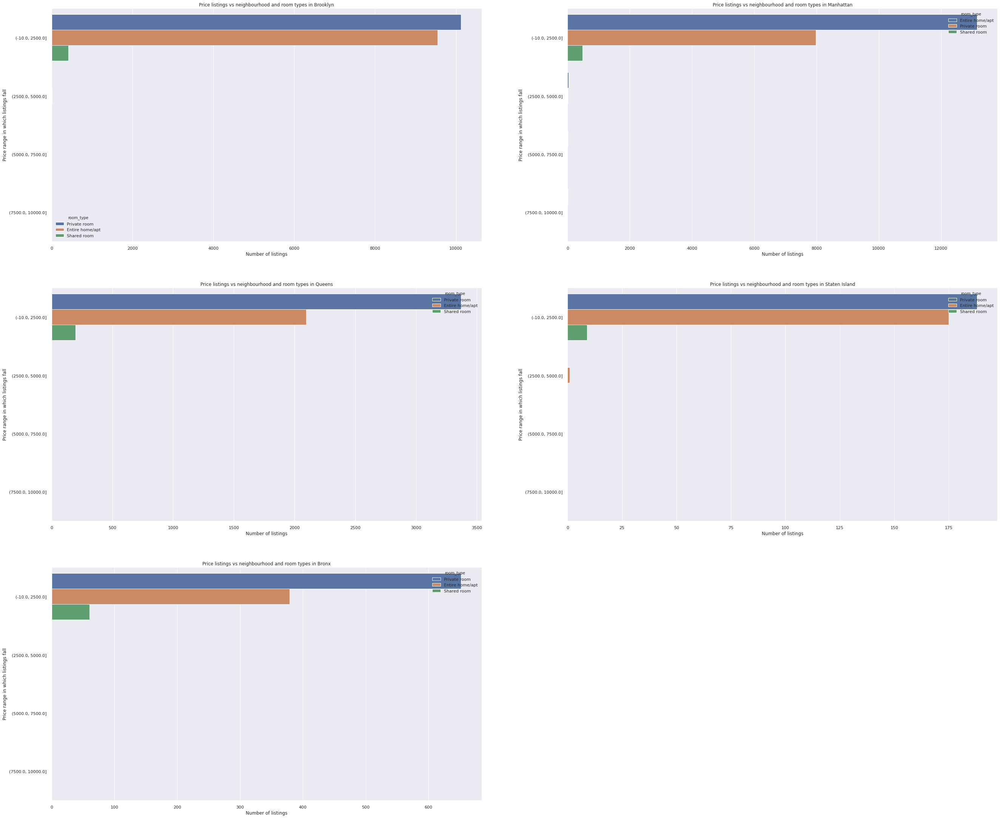

In [63]:
neighbourhood_group=list(df.neighbourhood_group.unique())

plt.figure(figsize=(40,36))

for i,neighbour in enumerate(neighbourhood_group):
    plt.subplot(3,2,i+1)
    sns.countplot(y='price_range',hue='room_type',data=df[df['neighbourhood_group']==neighbour])
    
    plt.xlabel('Number of listings')
    plt.ylabel('Price range in which listings fall')
    plt.title('Price listings vs neighbourhood and room types in {}'.format(neighbour))

Text(0.5, 1.0, 'neighbourhood_group price distribution < 500')

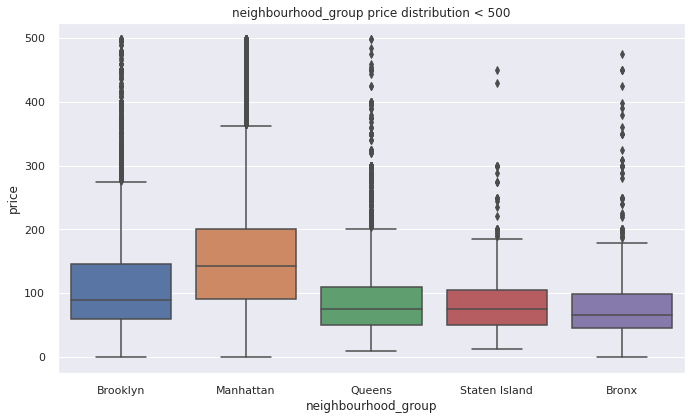

In [64]:
g = df[df.price <500]

plt.figure(figsize=(10,6))

sns.boxplot(y="price",x ='neighbourhood_group' ,data = g)
plt.title("neighbourhood_group price distribution < 500")
# plt.show()

Text(0, 0.5, 'Price')

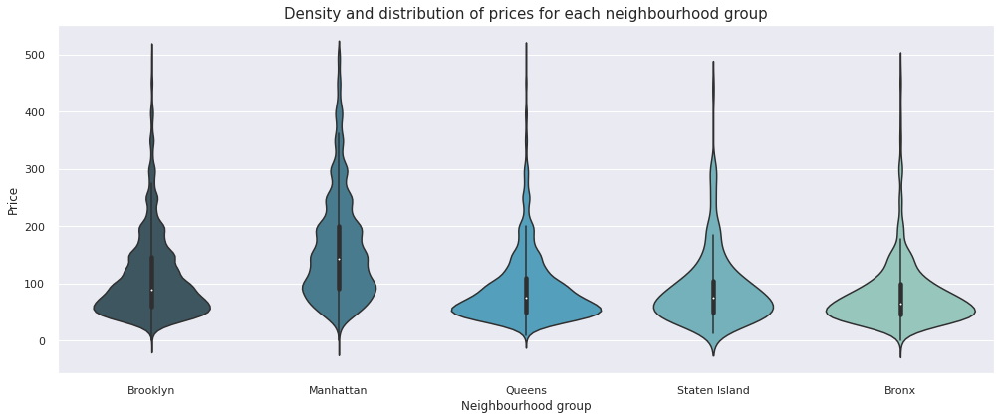

In [65]:
# distribution of prices

plt.figure(figsize=(15,6))

sns.violinplot(data=df[df.price <500], x='neighbourhood_group', y='price', palette='GnBu_d')

plt.title('Density and distribution of prices for each neighbourhood group', fontsize=15)
plt.xlabel('Neighbourhood group')
plt.ylabel("Price")

In [66]:
!pip install calmap

!pip install folium

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [67]:
import plotly.express as px
import plotly.graph_objs as go
import calmap
import folium

In [68]:
fig = px.histogram(df, x="neighbourhood_group", color = 'neighbourhood_group', height=600, width=800, )
fig.update_layout(showlegend = True)
fig.show()

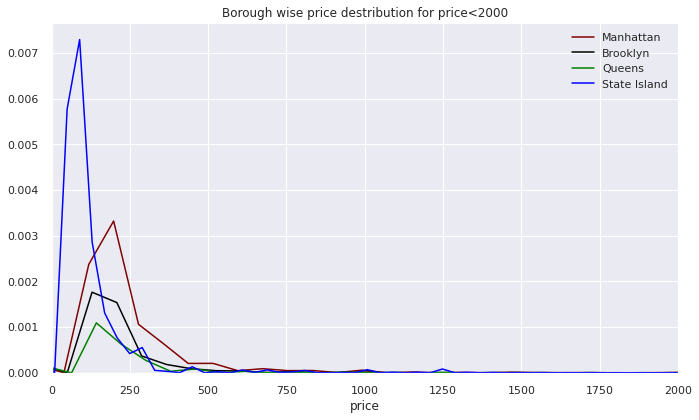

In [69]:
plt.figure(figsize=(10,6))

sns.distplot(df[df.neighbourhood_group=='Manhattan'].price,color='maroon',hist=False,label='Manhattan')
sns.distplot(df[df.neighbourhood_group=='Brooklyn'].price,color='black',hist=False,label='Brooklyn')
sns.distplot(df[df.neighbourhood_group=='Queens'].price,color='green',hist=False,label='Queens')
sns.distplot(df[df.neighbourhood_group=='Staten Island'].price,color='blue',hist=False,label='State Island')
sns.distplot(df[df.neighbourhood_group=='Long Island'].price,color='lavender',hist=False,label='Long Island')
plt.title('Borough wise price destribution for price<2000')
plt.xlim(0,2000)
plt.show()

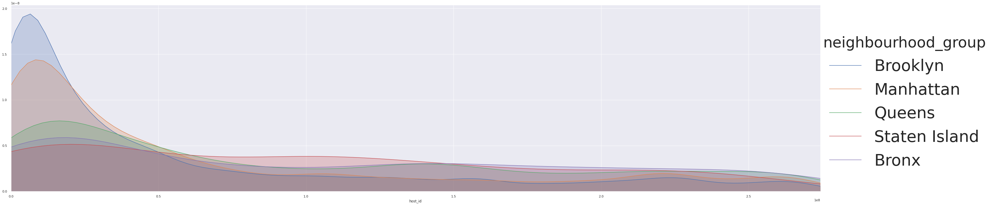

In [70]:
# Another way to visualize the data is to use FacetGrid to plot multiple kedplots on one plot

fig = sns.FacetGrid(df, hue="neighbourhood_group", aspect=4, height=10)
fig.map(sns.kdeplot, 'host_id', shade=True)
oldest = df['host_id'].max()
fig.set(xlim=(0, oldest))
sns.set(font_scale=5)
fig.add_legend()

# Observation:

##### In all listings registered in AirBnB New York, private rooms are most expensive in Manhattan region with an average price of registered listing being 197 dollars, and average price of private room is 116.78 dollars and individual apartment being 249.23 dollars.

##### The neighbourhood region with maximum number of affordable rooms is Brooklyn with more than 10000 private rooms with average price of 76 dollars and average price of entire apartment around 178 dollars.

##### The cheapest neighbourhood is Staten with an average price of 66 dollars and 127 dollars for private rooms and apartments respectively. Maximum price of apartment and private rooms in this neighbourgood is 1000 dollars and 2500 dollars respectively.

##### Manhattan is the most expensive region followed by Brooklyn.

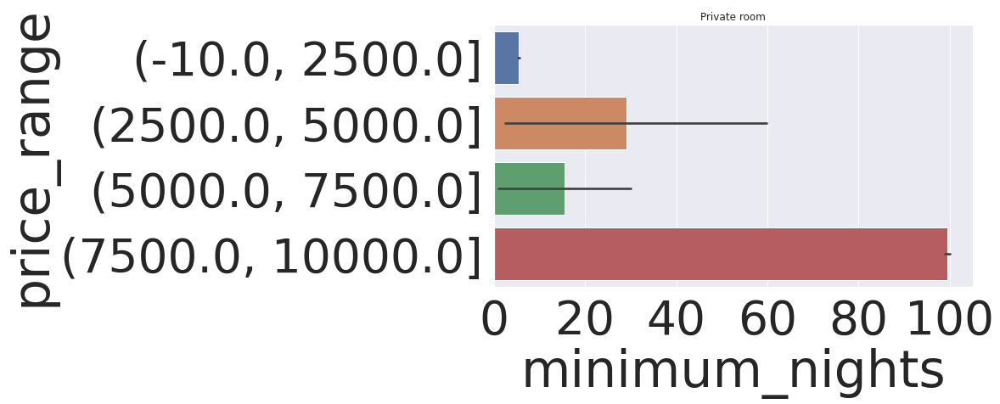

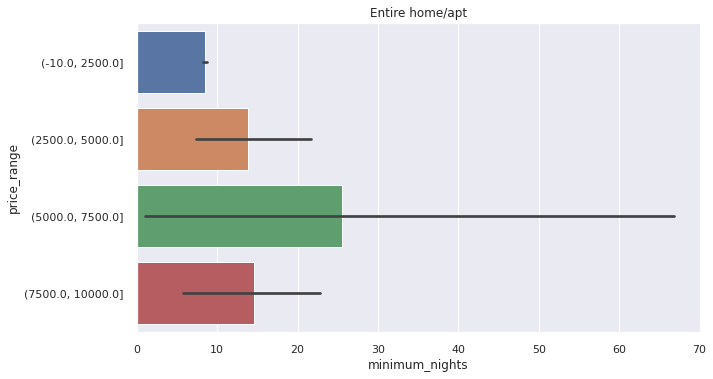

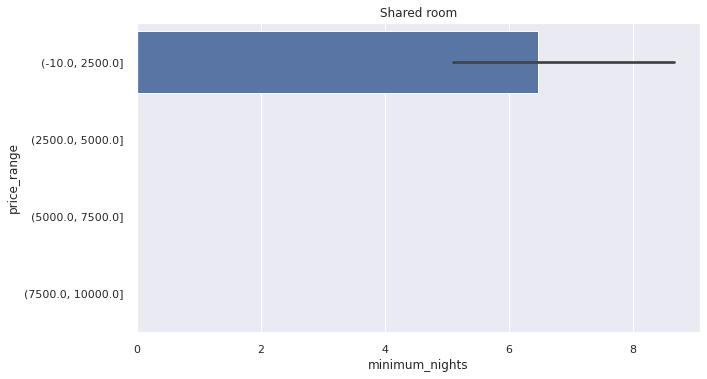

In [71]:
rooms=list(df.room_type.unique())

for i,room in enumerate(rooms):
    plt.figure(figsize=(9,18))
    plt.subplot(3,1,i+1)
    sns.barplot(y='price_range',x='minimum_nights',data=df[(df.room_type==room)])
    sns.set(font_scale=1)
    plt.title(room)

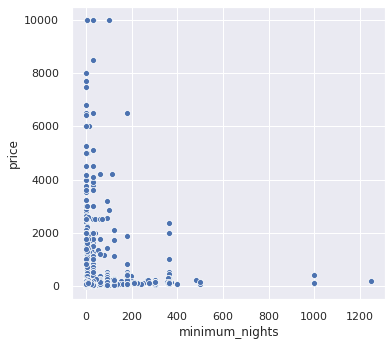

In [72]:
plt.figure(figsize=(5,5))
sns.scatterplot(x='minimum_nights',y='price',data=df)

# Minimum Nights and price range

In [73]:
df.groupby(['room_type','price_range'])['minimum_nights'].describe()

count       mean        std   min    25%  \
room_type       price_range                                                     
Entire home/apt (-10.0, 2500.0]    25355.0   8.491185  22.926415   1.0   2.00   
                (2500.0, 5000.0]      38.0  13.842105  23.201265   1.0   1.00   
                (5000.0, 7500.0]       9.0  25.555556  58.762469   1.0   1.00   
                (7500.0, 10000.0]      7.0  14.571429  14.524200   1.0   3.00   
Private room    (-10.0, 2500.0]    22314.0   5.360043  16.242523   1.0   1.00   
                (2500.0, 5000.0]       8.0  29.125000  48.265449   1.0   1.00   
                (5000.0, 7500.0]       2.0  15.500000  20.506097   1.0   8.25   
                (7500.0, 10000.0]      2.0  99.500000   0.707107  99.0  99.25   
Shared room     (-10.0, 2500.0]     1160.0   6.475000  31.458825   1.0   1.00   

                                    50%    75%     max  
room_type       price_range                             
Entire home/apt (-10.0, 2500.0]     3.0   5.00  1250.0  
                (2500.0, 5000.0]    1.0  30.00    90.0  
                (5000.0, 7500.0]    1.0  14.00   180.0  
                (7500.0, 10000.0]   5.0  30.00    30.0  
Private room    (-10.0, 2500.0]     2.0   4.00   999.0  
                (2500.0, 5000.0]    4.5  30.25   114.0  
                (5000.0, 7500.0]   15.5  22.75    30.0  
                (7500.0, 10000.0]  99.5  99.75   100.0  
Shared room     (-10.0, 2500.0]     1.0   3.00   999.0

# Observation:

#### Minimum number of night stays has no significant impact on prices.

#### In case of private rooms, price range for longer duration with minimum stay of 8 nights and above is quite on a higher side. People pays huge amount to stay for longer days.

# Area wise visualization of availability of listings

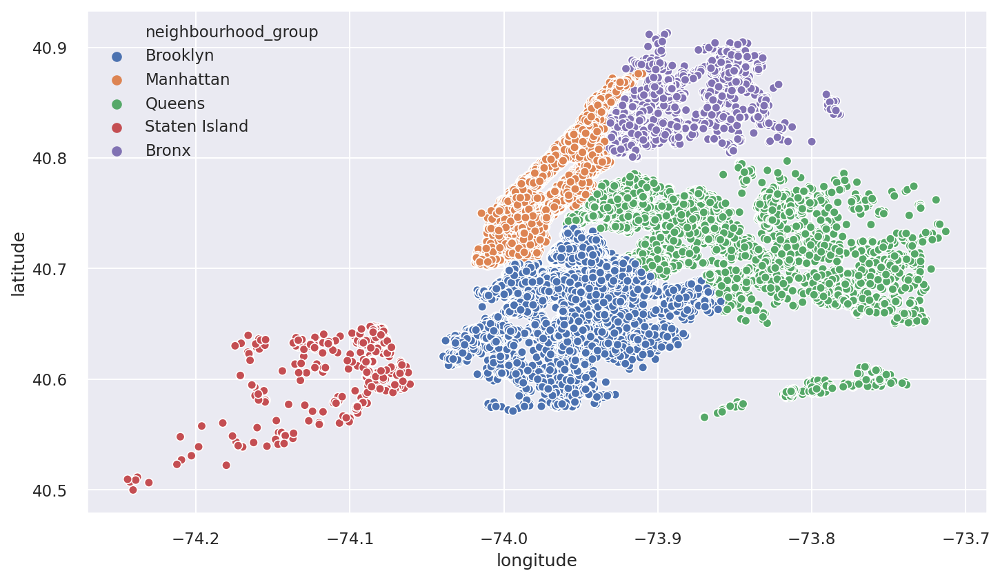

In [74]:
plt.figure(figsize=(10,6), dpi = 150)
sns.scatterplot(df.longitude,df.latitude,hue=df.neighbourhood_group)
plt.ioff()

In [75]:
import folium
from folium.plugins import HeatMap


m = folium.Map([40.7128,-74.0060],zoom_start=11)

HeatMap(df[['latitude','longitude']].dropna(),radius=8, gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(m)

display(m)

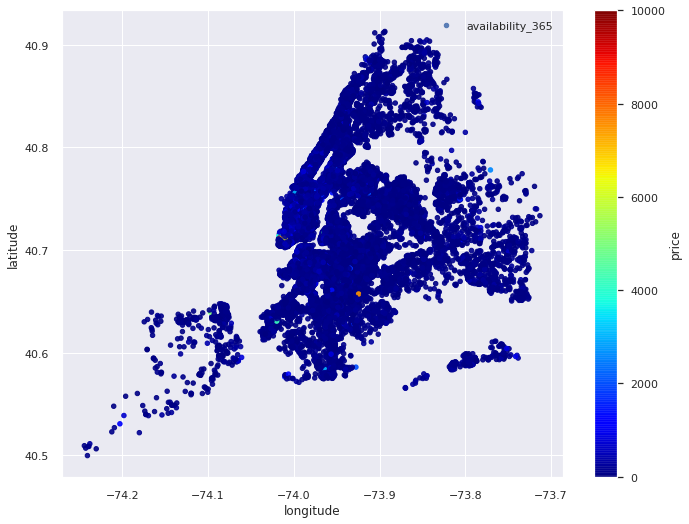

In [76]:
#let's what we can do with our given longtitude and latitude columns

#let's see how scatterplot will come out 
viz=df.plot(kind='scatter', x='longitude', y='latitude', label='availability_365', c='price',
                  cmap=plt.get_cmap('jet'), colorbar=True, alpha=0.9, figsize=(10,8))
viz.legend()

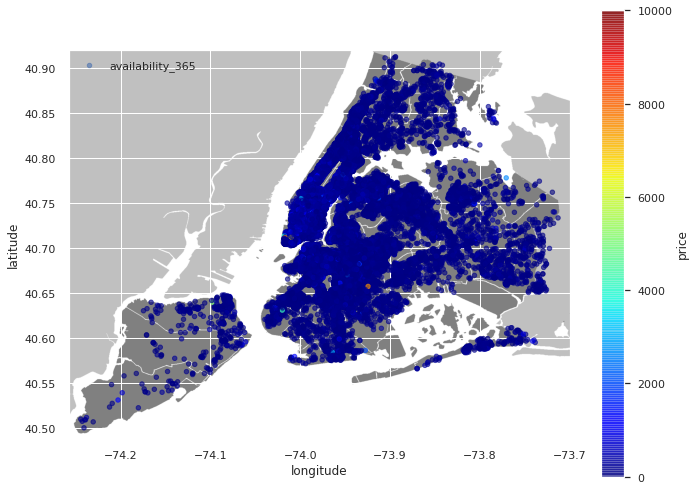

In [77]:
import urllib

#initializing the figure size

plt.figure(figsize=(10,8))

#loading the png NYC image found on Google and saving to my local folder along with the project
i=urllib.request.urlopen('https://upload.wikimedia.org/wikipedia/commons/e/ec/Neighbourhoods_New_York_City_Map.PNG')
nyc_img=plt.imread(i)


#scaling the image based on the latitude and longitude max and mins for proper output
plt.imshow(nyc_img,zorder=0,extent=[-74.258, -73.7, 40.49,40.92])

ax=plt.gca()

#using scatterplot again
df.plot(kind='scatter', x='longitude', y='latitude', label='availability_365', c='price', ax=ax, 
           cmap=plt.get_cmap('jet'), colorbar=True, alpha=0.6, zorder=5)

plt.legend()
plt.show()


In [78]:
#let's grab 100 most reviewed listings in NYC
top_reviewed_listings=df.nlargest(100,'number_of_reviews')
top_reviewed_listings

,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,price,price_range
11759,47621202,Queens,Jamaica,40.66730,-73.76831,Private room,1,629,2019-07-05,14.58,2,333,47,"(-10.0, 2500.0]"
2031,4734398,Manhattan,Harlem,40.82085,-73.94025,Private room,1,607,2019-06-21,7.75,3,293,49,"(-10.0, 2500.0]"
2030,4734398,Manhattan,Harlem,40.82124,-73.93838,Private room,1,597,2019-06-23,7.72,3,342,49,"(-10.0, 2500.0]"
2015,4734398,Manhattan,Harlem,40.82264,-73.94041,Private room,1,594,2019-06-15,7.57,3,339,49,"(-10.0, 2500.0]"
13495,47621202,Queens,Jamaica,40.66939,-73.76975,Private room,1,576,2019-06-27,13.40,2,173,47,"(-10.0, 2500.0]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7317,27944388,Manhattan,East Harlem,40.80226,-73.94506,Private room,1,325,2019-06-19,6.19,1,108,70,"(-10.0, 2500.0]"
22100,121391142,Queens,Springfield Gardens,40.66600,-73.76333,Private room,1,325,2019-06-12,11.72,2,0,65,"(-10.0, 2500.0]"
116,115307,Brooklyn,Williamsburg,40.71942,-73.95748,Entire home/apt,3,324,2019-06-23,3.01,1,107,325,"(-10.0, 2500.0]"
2111,5239845,Brooklyn,Bushwick,40.69288,-73.90374,Private room,2,324,2019-06-28,4.30,1,267,62,"(-10.0, 2500.0]"


In [79]:
price_avrg=top_reviewed_listings.price.mean()
print('Average price per night: {}'.format(price_avrg))

Average price per night: 95.53


In [80]:
top_reviewed_listings.groupby('room_type')['price'].describe()

,count,mean,std,min,25%,50%,75%,max
room_type,,,,,,,,
Entire home/apt,25.0,170.480000,103.111639,49.0,115.00,145.0,189.0,575.0
Private room,74.0,70.972973,27.156559,29.0,49.25,65.0,89.5,163.0
Shared room,1.0,39.000000,NaN,39.0,39.00,39.0,39.0,39.0


# Observation:

##### Most of listings who got more reviews have private rooms.
##### Probably people prefer to book apartment or private rooms as compared to shared room and give reviews.
##### Average price for preferred apartment is 170 dollars and 74 dollars for private rooms.

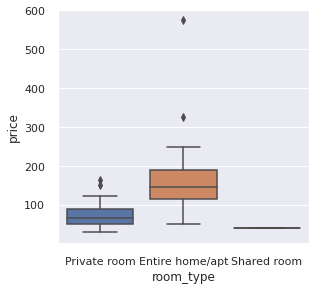

In [81]:
sns.boxplot(y='price',x='room_type',data=top_reviewed_listings)

# Room availability

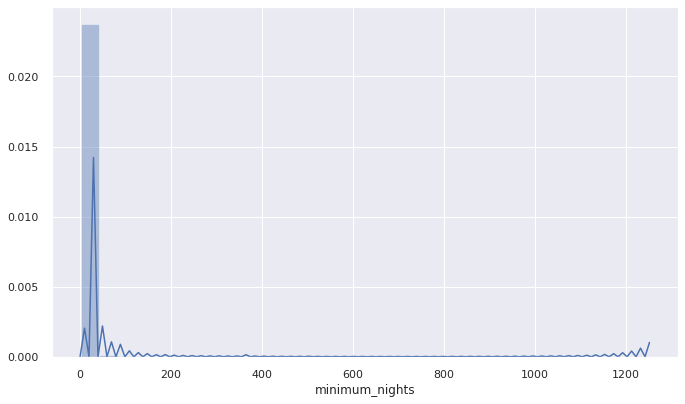

In [82]:
plt.figure(figsize=(10,6))
sns.distplot(df['minimum_nights'], bins=30)

#(df['minimum_nights'] <= 30) & (df['minimum_nights'] > 0)
# copy above code in to the first [] 
plt.ioff()

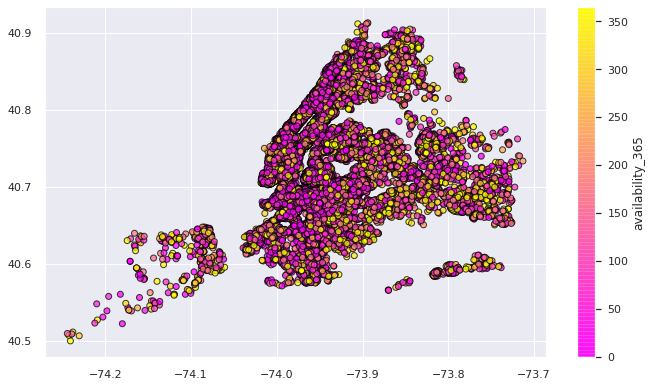

In [83]:
plt.figure(figsize=(10,6))
plt.scatter(df.longitude, df.latitude, c=df.availability_365, cmap='spring', edgecolor='black', linewidth=1, alpha=0.75)

cbar = plt.colorbar()
cbar.set_label('availability_365')

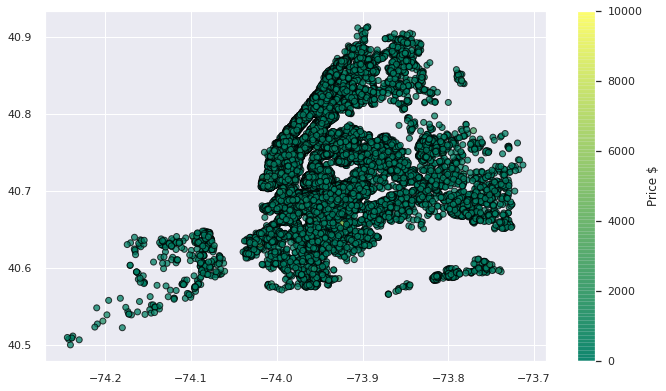

In [84]:
plt.figure(figsize=(10,6))
plt.scatter(df.longitude, df.latitude, c=df.price, cmap='summer', edgecolor='black', linewidth=1, alpha=0.75)

cbar = plt.colorbar()
cbar.set_label('Price $')

# Observation:
#### Most of the listings have room availability for booking for minimum of 1 day

# Correlation among variables

In [85]:
df.corr()

,host_id,latitude,longitude,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,price
host_id,1.000000,0.020224,0.127055,-0.017364,-0.140106,0.209783,0.154950,0.203492,0.015309
latitude,0.020224,1.000000,0.084788,0.024869,-0.015389,-0.018758,0.019517,-0.010983,0.033939
longitude,0.127055,0.084788,1.000000,-0.062747,0.059094,0.138516,-0.114713,0.082731,-0.150019
minimum_nights,-0.017364,0.024869,-0.062747,1.000000,-0.080116,-0.124905,0.127960,0.144303,0.042799
number_of_reviews,-0.140106,-0.015389,0.059094,-0.080116,1.000000,0.589407,-0.072376,0.172028,-0.047954
reviews_per_month,0.209783,-0.018758,0.138516,-0.124905,0.589407,1.000000,-0.047312,0.163732,-0.050564
calculated_host_listings_count,0.154950,0.019517,-0.114713,0.127960,-0.072376,-0.047312,1.000000,0.225701,0.057472
availability_365,0.203492,-0.010983,0.082731,0.144303,0.172028,0.163732,0.225701,1.000000,0.081829
price,0.015309,0.033939,-0.150019,0.042799,-0.047954,-0.050564,0.057472,0.081829,1.000000


Index(['host_id', 'neighbourhood_group', 'neighbourhood', 'latitude',
       'longitude', 'room_type', 'minimum_nights', 'number_of_reviews',
       'last_review', 'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'price', 'price_range'],
      dtype='object')

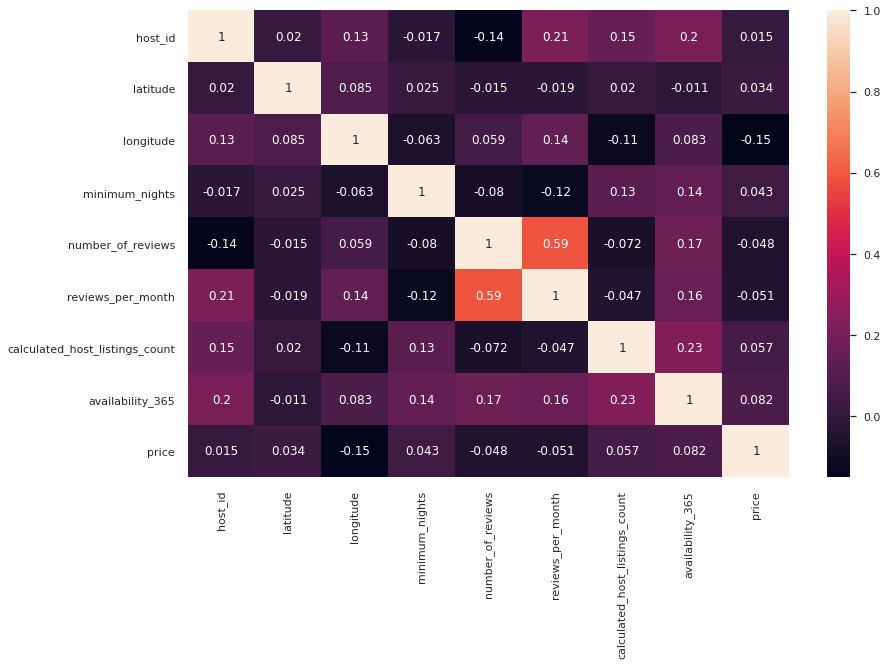

In [86]:
#Get Correlation between different variables
corr = df.corr()
plt.figure(figsize=(12,8))

sns.heatmap(corr, annot=True)
df.columns

In [87]:
!pip install wordcloud

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


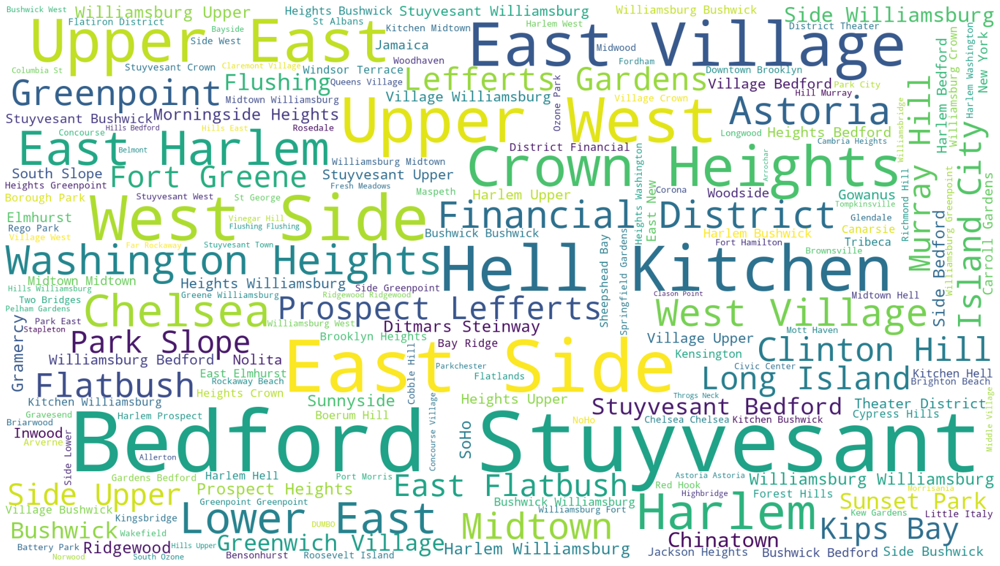

In [88]:
from wordcloud import WordCloud

plt.subplots(figsize=(25,15))

wordcloud = WordCloud(
                          background_color='white',
                          width=1920,
                          height=1080
                         ).generate(" ".join(df.neighbourhood))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('neighbourhood.png')
plt.show()